In [1]:
# Imports
import sys
import time
import cv2
import matplotlib.pyplot as plt
import numpy as np
from openvino.runtime import Core
from collections import namedtuple
from u2net import U2NET, U2NETP
from openvino.tools import mo
import torch

from notebooks.utils.notebook_utils import load_image

In [2]:
# Load images
import glob
images = glob.glob("cube/*color*")
def sort_by(data):
    return int(data.split("/")[-1].split("color")[0])
images = sorted(images, key=sort_by)
# Load Saliency Model
class Saliency:
    def __init__(self):
        model_config = namedtuple("ModelConfig", ["name", "url", "model", "model_args"])

        u2net_lite = model_config(
            name="u2net_lite",
            url="https://drive.google.com/uc?id=1rbSTGKAE-MTxBYHd-51l2hMOQPT_7EPy",
            model=U2NETP,
            model_args=(),
        )
        u2net_model = u2net_lite
        model_path  = "u2net_lite.pth"

        # Load the model.
        net = u2net_model.model(*u2net_model.model_args)
        net.eval()
        net.load_state_dict(state_dict=torch.load(model_path, map_location="cpu"))

        model_ir = mo.convert_model(
            net, input_shape=[1,3, 512, 512],
            mean_values=[123.675, 116.28 , 103.53],
            scale_values=[58.395, 57.12 , 57.375],
            compress_to_fp16=True
        )

        # Load the network to OpenVINO Runtime.
        ie = Core()
        self.compiled_model_ir = ie.compile_model(model=model_ir, device_name="CPU")
        # Get the names of input and output layers.
        input_layer_ir = self.compiled_model_ir.input(0)
        self.output_layer_ir = self.compiled_model_ir.output(0)

    def inference(self, image):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        resized_image = cv2.resize(src=image, dsize=(512, 512))
        input_image = np.expand_dims(np.transpose(resized_image, (2, 0, 1)), 0)
        result = self.compiled_model_ir([input_image])[self.output_layer_ir]
        resized_result = np.rint(
        cv2.resize(src=np.squeeze(result), dsize=(image.shape[1], image.shape[0]))).astype(np.uint8)
        return resized_result
    
# Load Depth Model
class Depth:
    def __init__(self,):
        ie = Core()
        ie.set_property({'CACHE_DIR': '../cache'})
        model = ie.read_model("MiDaS_small.xml")
        self.compiled_model = ie.compile_model(model=model, device_name="CPU")

        input_key = self.compiled_model.input(0)
        self.output_key = self.compiled_model.output(0)

        network_input_shape = list(input_key.shape)
        self.network_image_height, self.network_image_width = network_input_shape[2:]

    @staticmethod
    def normalize_minmax(data):
        """Normalizes the values in `data` between 0 and 1"""
        return (data - data.min()) / (data.max() - data.min())

    @staticmethod
    def to_rgb(image_data) -> np.ndarray:
        """
        Convert image_data from BGR to RGB
        """
        return cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB)

    def get_depth_map(self, image):
        # Resize to input shape for network.
        resized_image = cv2.resize(src=image, dsize=(self.network_image_height, self.network_image_width))

        # Reshape the image to network input shape NCHW.
        input_image = np.expand_dims(np.transpose(resized_image, (2, 0, 1)), 0)
        result = self.compiled_model([input_image])[self.output_key]
        result = result.squeeze(0)
        result = self.normalize_minmax(result)
        result_image = cv2.resize(result, image.shape[:2][::-1])
        return result_image
    
depth_model = Depth()
saliency_model = Saliency()

/home/dungvan/miniconda3/envs/hackathon/lib/python3.8/site-packages/torch/nn/functional.py:3737: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


============== Diagnostic Run torch.onnx.export version 2.0.0+cpu ==============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



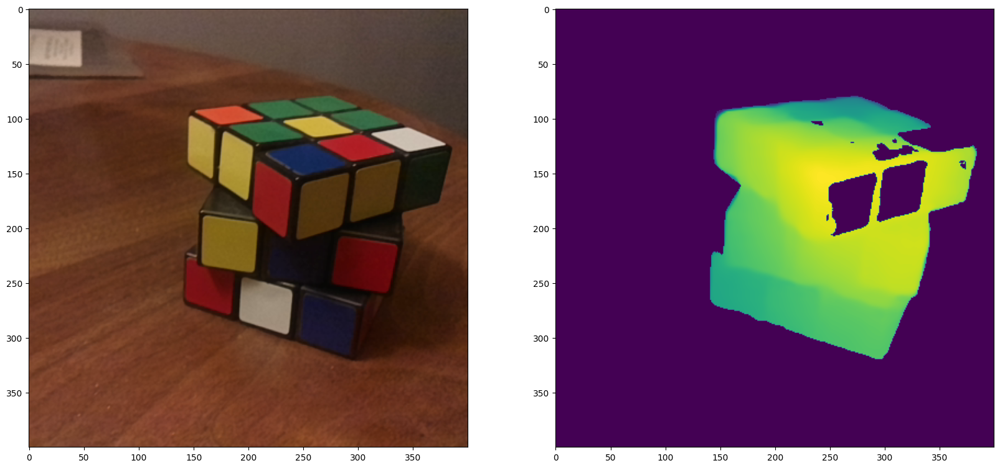

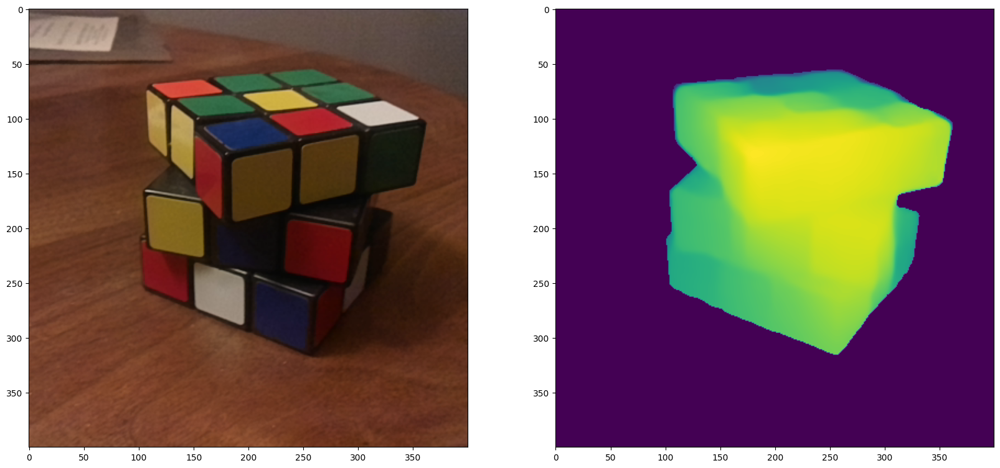

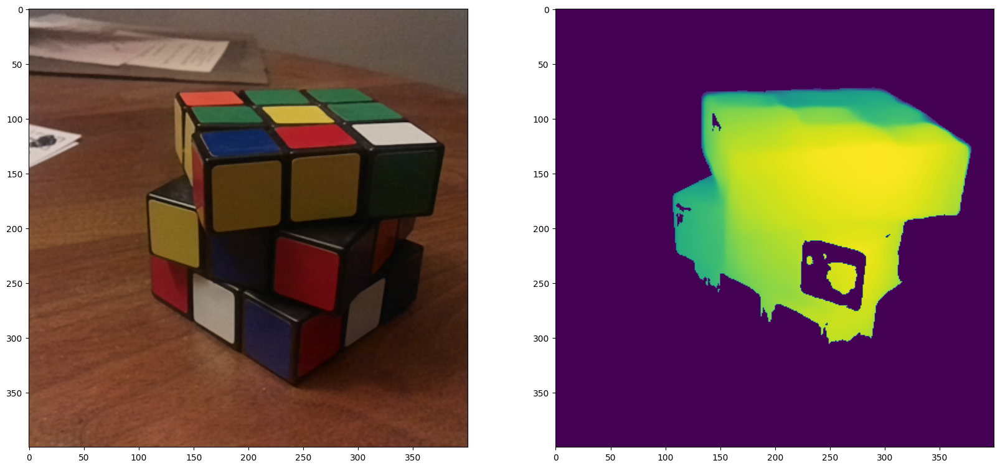

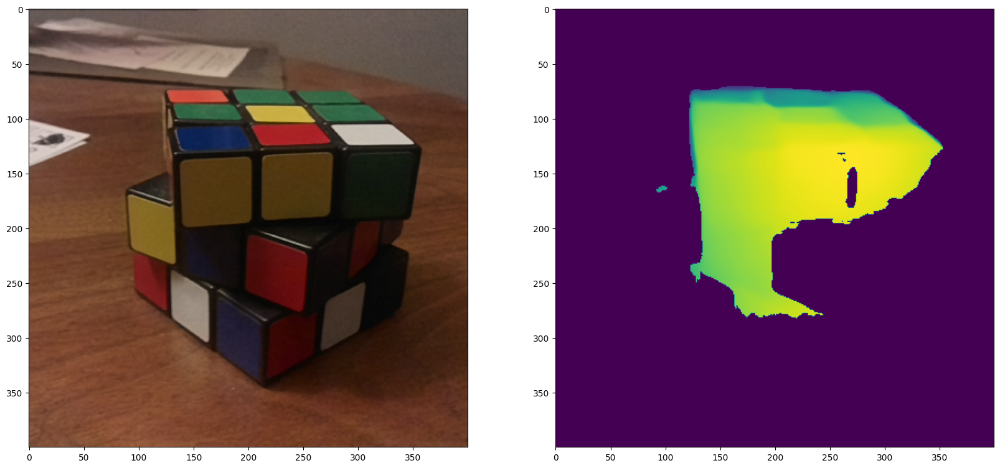

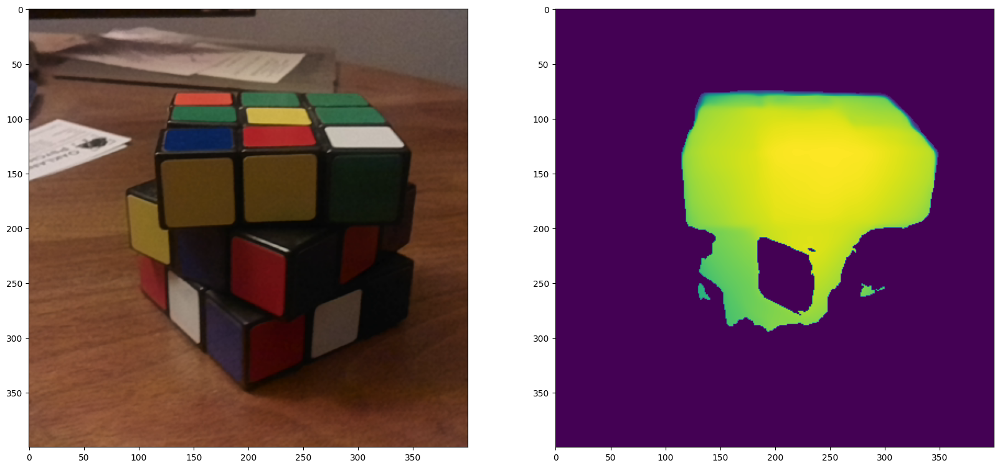

...

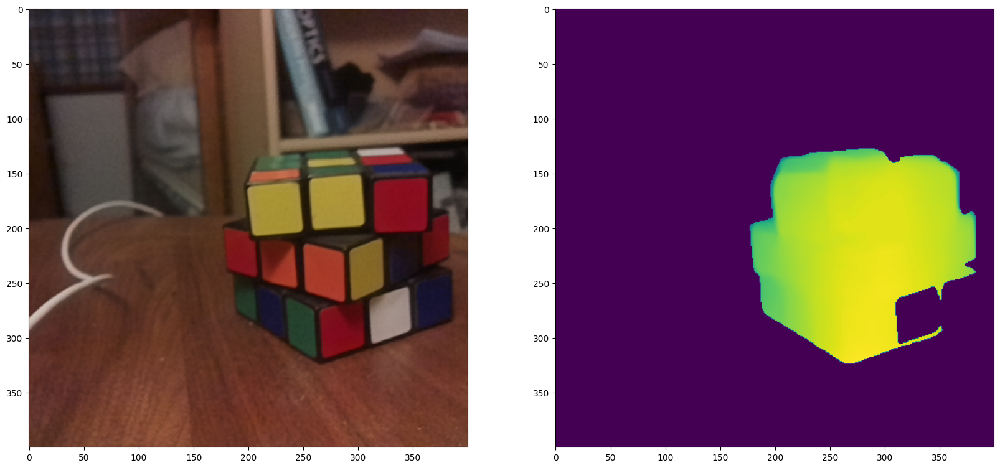

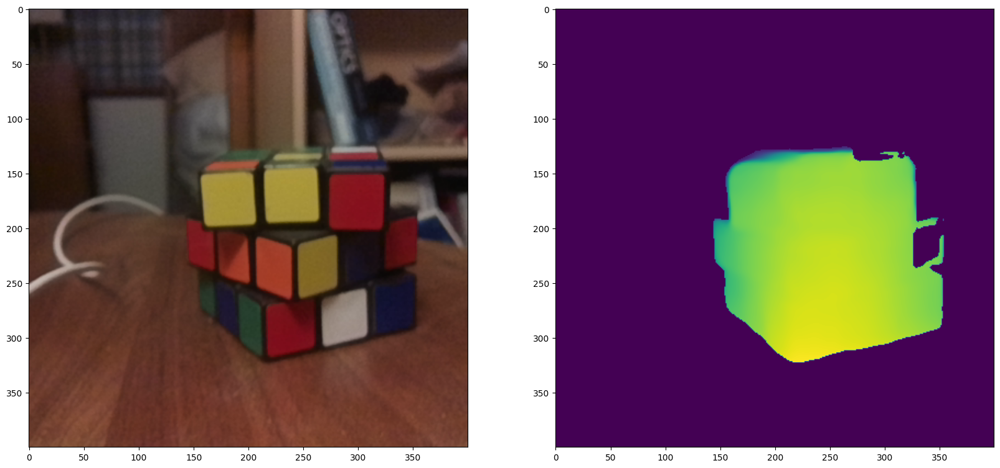

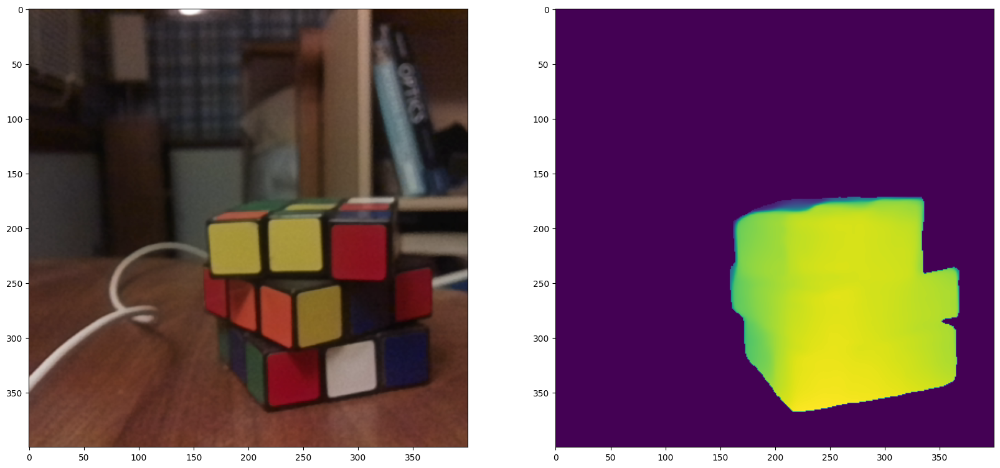

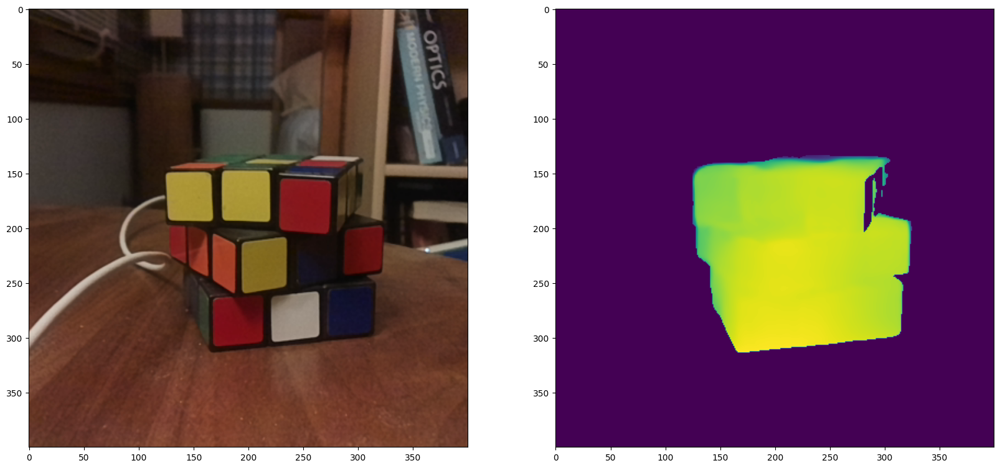

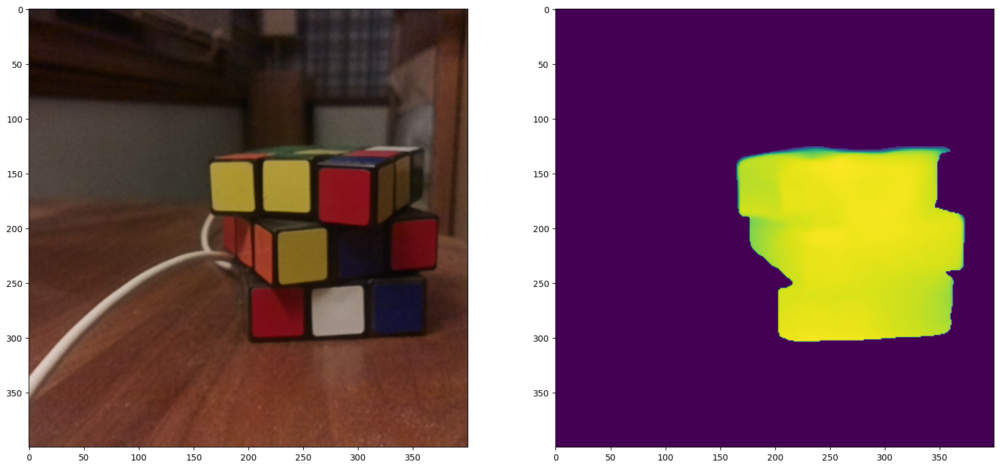

In [3]:
for IMAGE_FILE in images:
    image = load_image(path=IMAGE_FILE)
    
    # Get depth map
    depth = depth_model.get_depth_map(image)

    # Get saliency map
    saliency = saliency_model.inference(image)

    # Filter depth_map
    filtered = depth * saliency

    # save depth map
    save_path = IMAGE_FILE.replace("color.png", "_depth.npy")
    np.save(save_path, filtered)
    
    # Visualize
    fig, ax = plt.subplots(1, 2, figsize=(20, 15))
    ax[0].imshow(depth_model.to_rgb(image))
    ax[1].imshow(filtered)
    plt.show()

cube/7color.png
36580
cube/8color.png


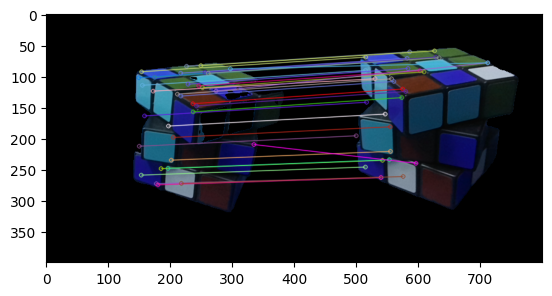

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49780/49780 [00:53<00:00, 927.63it/s]


48487
cube/9color.png


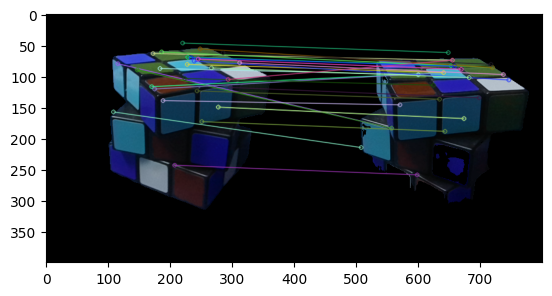

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40355/40355 [01:00<00:00, 671.94it/s]


54897
cube/10color.png


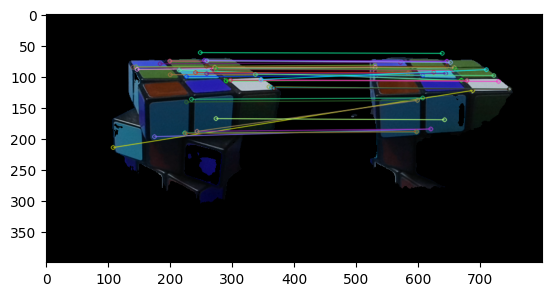

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28913/28913 [00:46<00:00, 624.81it/s]


58110
cube/11color.png


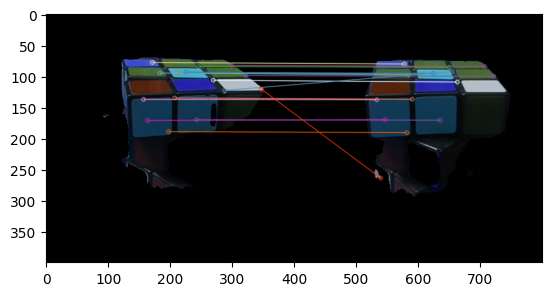

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34291/34291 [00:57<00:00, 597.85it/s]


75220
cube/12color.png


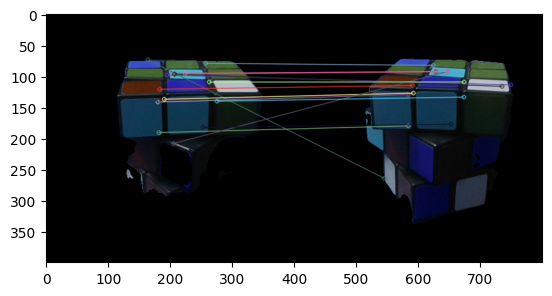

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47693/47693 [01:43<00:00, 458.92it/s]


80999
cube/13color.png


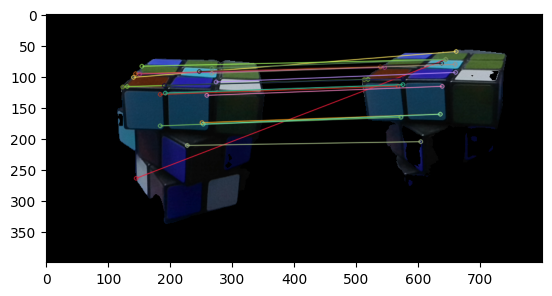

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29338/29338 [01:09<00:00, 423.28it/s]


81957
cube/14color.png


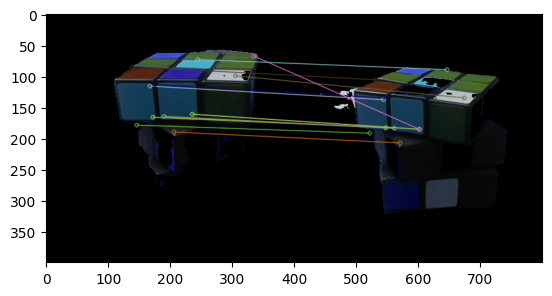

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39503/39503 [01:40<00:00, 392.08it/s]


91480
cube/15color.png


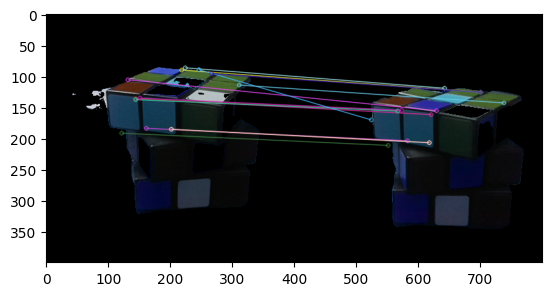

 49%|██████████████████████████████████████████████████████████▉                                                             | 20610/41986 [01:01<01:04, 333.43it/s]


KeyboardInterrupt: 

In [5]:
def to_pcd(image, depth):
    if len(depth.shape) == 2:
        depth = depth[:,:,np.newaxis]
    assert len(image.shape) == 3
    mask_y = np.tile(np.arange(image.shape[0])[:,np.newaxis],image.shape[1])
    mask_x = np.tile(np.arange(image.shape[1])[:,np.newaxis],image.shape[0]).T
    comb = np.concatenate([image.astype(float), mask_x[:,:,np.newaxis], mask_y[:,:,np.newaxis], depth], axis=-1) #RGB XYZ
    pcd = comb[depth[:,:,0]!=0].reshape(-1,6)
    return pcd

import cv2 as cv
sift = cv.SIFT_create()
from tqdm import tqdm

# Naive matching
global_pcd = None
prev_img = None
prev_depth = None
sequence = []
for IMAGE_FILE in images:
    print(IMAGE_FILE)
    image = load_image(path=IMAGE_FILE)
    depth = np.load(IMAGE_FILE.replace("color.png", "_depth.npy"))
    tmp_pcd = to_pcd(image, depth)
    image[depth==0]=0
    
    # Matching
    if global_pcd is None:
        global_pcd = tmp_pcd
        prev_img = image
        prev_depth = depth
        print(len(global_pcd))
        continue
    else:
        # Feature matching
        # find the keypoints and descriptors with SIFT
        kp1, des1 = sift.detectAndCompute(prev_img,None)
        kp2, des2 = sift.detectAndCompute(image,None)
        # BFMatcher with default params
        bf = cv.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.7*n.distance:
                good.append([m])
        

        pt1s, pt2s = [],[]
        for matches in good:
            for match in matches:
                pt1 = np.array(kp1[match.queryIdx].pt).astype(int)
                pt2 = np.array(kp2[match.trainIdx].pt).astype(int)
                z_pt1 = prev_depth[pt1[1],pt1[0]]
                z_pt2 = depth[pt2[1],pt2[0]]
                pt1 = np.append(pt1, z_pt1)
                pt2 = np.append(pt2, z_pt2)
                pt1s.append(pt1)
                pt2s.append(pt2)
        if len(pt1s) < 10:
            prev_img = image
            prev_depth = depth 
            continue
        else:
            img3 = cv.drawMatchesKnn(prev_img,kp1,image,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(img3),plt.show()
            prev_img = image
            prev_depth = depth 
        
            
        center_1 = np.average(pt1s, axis=0)
        center_2 = np.average(pt2s, axis=0)
        
        pt1s.append(center_1)
        pt2s.append(center_2)
        
        # Transform from pt2s to pt1a
        pt1s = np.array(pt1s)
        pt2s = np.array(pt2s)
        
        transform = cv.estimateAffine3D(pt2s, pt1s)
        sequence.append(transform[1])

        # Update PCD
        tmp_xyz = tmp_pcd[:, 3:]
        save_xyz = tmp_xyz.copy()
        
        tmp_xyz = np.concatenate([tmp_xyz, np.ones(tmp_xyz.shape[0]).reshape(-1,1)], axis=-1)
        for trans in sequence:
            ins_trans = np.concatenate([trans, np.array([0,0,0,1]).reshape(1,-1)], axis=0)
            tmp_xyz = np.dot(ins_trans, tmp_xyz.T).T
        tmp_pcd[:,3:] = tmp_xyz[:,:3]
        # Merge pts
        valid_pts = []
        for pts in tqdm(tmp_pcd):
            dists = abs(pts[3:] - global_pcd[:,3:])
            dists = np.min(np.sum(dists, axis=1))
            if dists >1:
                valid_pts.append(pts)
        
        global_pcd = np.concatenate([global_pcd, np.array(valid_pts)], axis=0)
        print(len(global_pcd))
        np.save("pcd.npy", global_pcd)
#     X = global_pcd[:,3:]
#     fig = px.scatter_3d(x=X[:,0], y=X[:, 1], z=X[:, 2])
#     fig.show() 